In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import seaborn as sns

In [5]:
df=sns.load_dataset('iris')

In [6]:
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [7]:
df['species']=df['species'].map({"setosa":0,"versicolor":1,"virginica":2})

In [11]:
from sklearn.tree import DecisionTreeClassifier
Classifier=DecisionTreeClassifier(criterion='entropy')
Classifier.fit(df.iloc[:,:-1],df.iloc[:,-1])

DecisionTreeClassifier(criterion='entropy')

<Figure size 1500x1000 with 0 Axes>

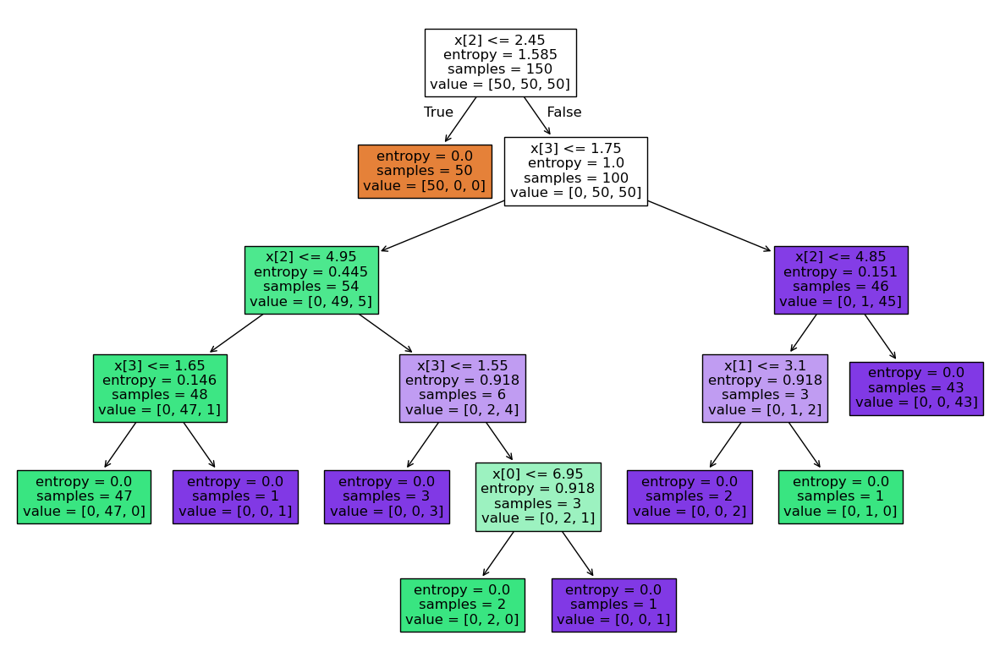

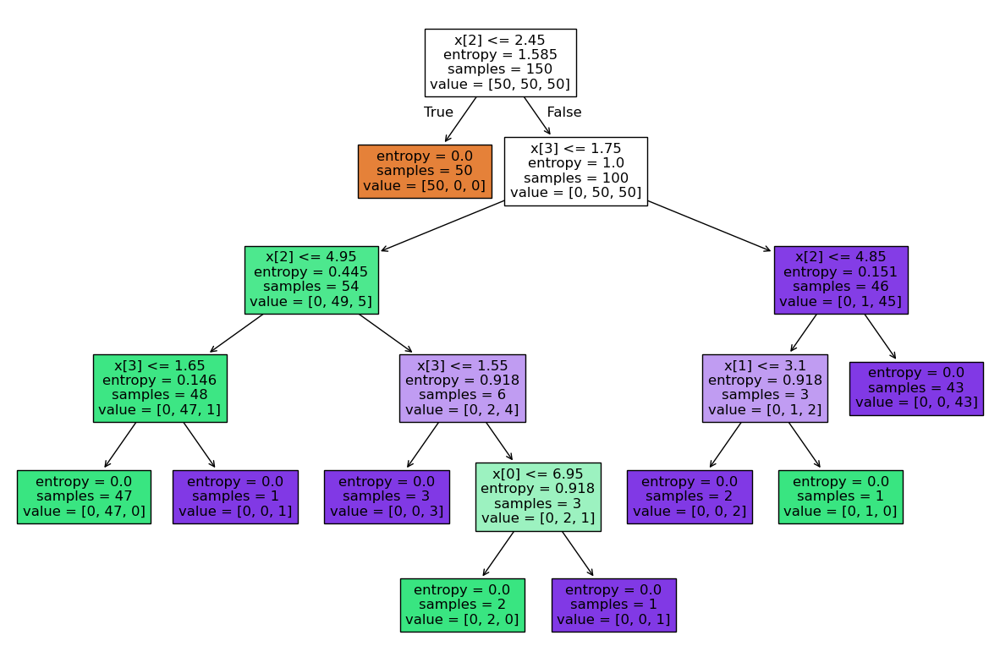

In [14]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(Classifier,filled=True)
plt.show()

In [15]:
from sklearn.tree import DecisionTreeClassifier
Classifier=DecisionTreeClassifier(criterion='gini')
Classifier.fit(df.iloc[:,:-1],df.iloc[:,-1])

DecisionTreeClassifier()

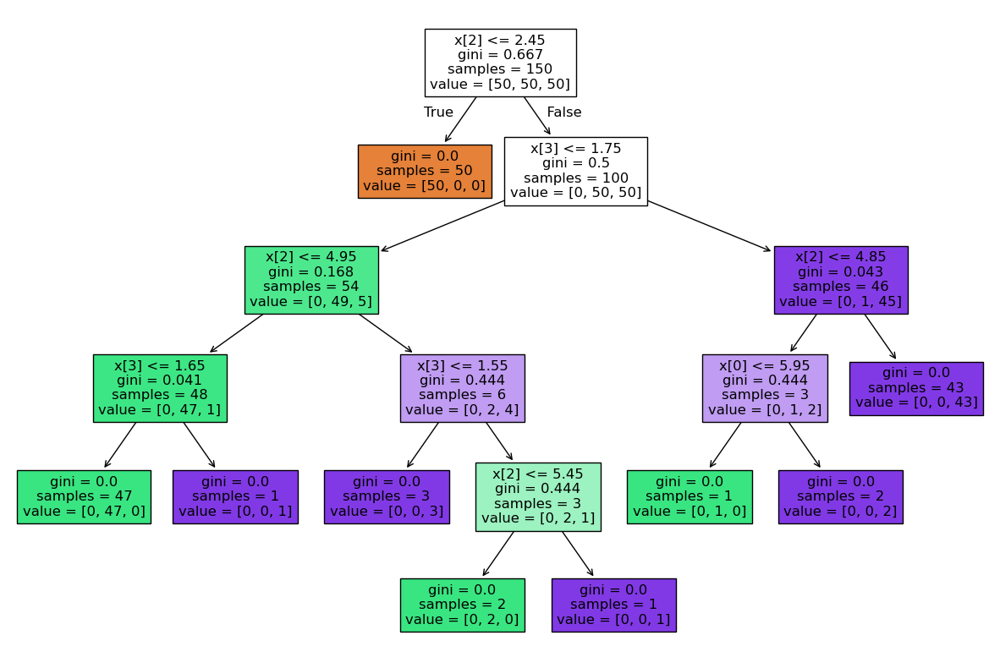

In [16]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(Classifier,filled=True)
plt.show()

In [17]:
from sklearn.tree import DecisionTreeClassifier
Classifier=DecisionTreeClassifier(criterion='gini',max_depth=2)
Classifier.fit(df.iloc[:,:-1],df.iloc[:,-1])

DecisionTreeClassifier(max_depth=2)

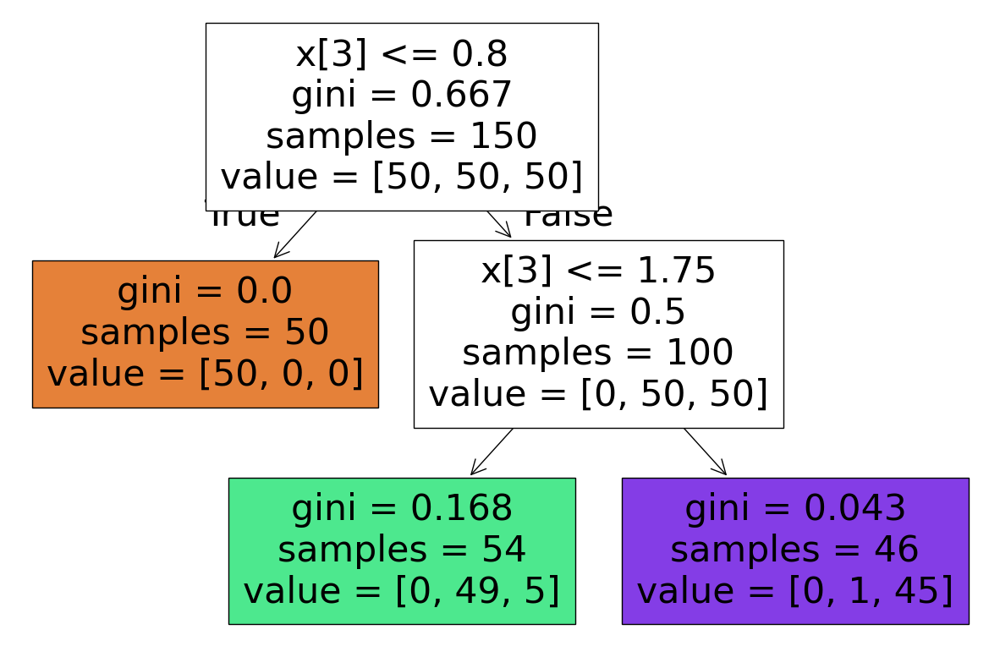

In [18]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(Classifier,filled=True)
plt.show()

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score ,roc_curve
from pandas_profiling import ProfileReport

C:\Users\mahas\AppData\Local\Temp\ipykernel_20172\3950301840.py:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv('winequality-red.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 11935.42it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
   df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
x = df.drop(columns = 'quality')

In [7]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [8]:
y = df['quality']

In [9]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [11]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size= .20 , random_state= 300)

In [16]:
dt = DecisionTreeClassifier()

In [17]:
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [37]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline


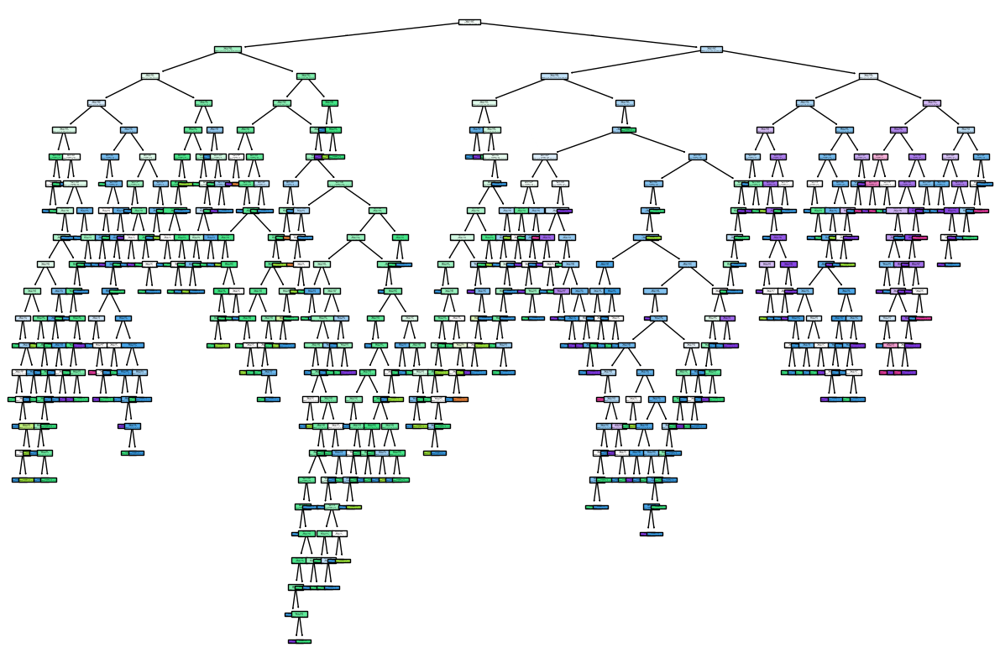

In [39]:

plt.figure(figsize=(15,10))
tree.plot_tree(dt,filled=True)
plt.show()
plt.savefig('dt_model_1')

In [18]:
dt.predict(x_test)

array([6, 5, 6, 7, 5, 5, 5, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 7, 8, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 5, 8, 5, 6, 5, 5, 4, 6, 6, 6, 7, 5, 5,
       6, 4, 6, 5, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 8, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       4, 6, 7, 6, 6, 7, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 5, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 5, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 6, 5, 7, 6, 6, 5, 6, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 6, 7, 5,
       5, 5, 6, 5, 5, 5, 6, 6, 7, 6, 6, 7, 5, 6, 5,

In [19]:
dt.score(x_test ,y_test)

0.60625

In [20]:
dt_en =DecisionTreeClassifier(criterion = "entropy")

In [25]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [26]:
dt_en.score(x_test , y_test)

0.590625

In [28]:
from sklearn import tree

In [32]:
outfile = open('dt_en_meta.dot','w')
tree.export_graphviz(dt_en,out_file=outfile , feature_names = x.columns)

In [40]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_10',
 '_17',
 '_18',
 '_19',
 '_23',
 '_24',
 '_25',
 '_26',
 '_3',
 '_30',
 '_33',
 '_4',
 '_5',
 '_7',
 '_9',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__session__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i34',
 '_i35',
 '_i36',
 '_i37',
 '_i38',
 '_i39',
 '_i4',
 '_i40',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dot_for_dt_en',
 'dt',
 'dt_en',
 'exit',
 'get_ipython',
 'np',
 'open',
 'outfile',
 'pd',
 'plt',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'sklearn',
 'train_test_split',
 'tree',
 'x',
 'x_test',
 'x_train',
 'y',
 '